#  Experience Analysis

>  user experience can be tracked by network parameter performances or the customers’ device characteristics. 


In [1]:
# importing libraries used to data representation and 
import pandas as pd
import numpy as np
from IPython.display import Image
import matplotlib.pyplot as plt


import warnings
warnings.filterwarnings('ignore')

In [2]:
from kneed import KneeLocator
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

In [3]:
import sys
 
# adding scripts folder to the system path
sys.path.insert(0, '../scripts/')

In [4]:
import PlotUtils as pu
import DataUtils as du

In [5]:
# read the dataset
db = pd.read_csv('../data/cleaned_telcom_data_final.csv')
db.head()

,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,...,Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,"13,114,483,460,844,900,352.00",4/4/2019 12:01,770.00,4/25/2019 14:35,662.00,"1,823,652.00","208,201,448,079,117.00","33,664,962,239.00","35,521,209,507,511.00",9.16456699548519E+015,...,"15,854,611.00","2,501,332.00","8,198,936.00","9,656,251.00","278,082,303.00","14,344,150.00","171,744,450.00","8,814,393.00","36,749,741.00","308,879,636.00"
1,"13,114,483,482,878,900,224.00",4/9/2019 13:04,235.00,4/25/2019 8:15,606.00,"1,365,104.00","208,201,909,211,140.00","33,681,854,413.00","35,794,009,006,359.00",L77566A,...,"20,247,395.00","19,111,729.00","18,338,413.00","17,227,132.00","608,750,074.00","1,170,709.00","526,904,238.00","15,055,145.00","53,800,391.00","653,384,965.00"
2,"13,114,483,484,080,500,736.00",4/9/2019 17:42,1.00,4/25/2019 11:58,652.00,"1,361,762.00","208,200,314,458,056.00","33,760,627,129.00","35,281,510,359,387.00",D42335A,...,"19,725,661.00","14,699,576.00","17,587,794.00","6,163,408.00","229,584,621.00","395,630.00","410,692,588.00","4,215,763.00","27,883,638.00","279,807,335.00"
3,"13,114,483,485,442,799,616.00",4/10/2019 0:31,486.00,4/25/2019 7:36,171.00,"1,321,509.00","208,201,402,342,131.00","33,750,343,200.00","35,356,610,164,913.00",T21824A,...,"21,388,122.00","15,146,643.00","13,994,646.00","1,097,942.00","799,538,153.00","10,849,722.00","749,039,933.00","12,797,283.00","43,324,218.00","846,028,530.00"
4,"13,114,483,499,480,700,928.00",4/12/2019 20:10,565.00,4/25/2019 10:40,954.00,"1,089,009.00","208,201,401,415,120.00","33,699,795,932.00","35,407,009,745,539.00",D88865A,...,"15,259,380.00","18,962,873.00","17,124,581.00","415,218.00","527,707,248.00","3,529,801.00","550,709,500.00","13,910,322.00","38,542,814.00","569,138,589.00"


In [6]:
db.columns

Index(['Bearer Id', 'Start', 'Start ms', 'End', 'End ms', 'Dur. (ms)', 'IMSI',
       'MSISDN/Number', 'IMEI', 'Last Location Name', 'Avg RTT DL (ms)',
       'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)',
       'TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)',
       'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)',
       '250 Kbps < DL TP < 1 Mbps (%)', 'DL TP > 1 Mbps (%)',
       'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)',
       '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)',
       'HTTP DL (Bytes)', 'HTTP UL (Bytes)', 'Activity Duration DL (ms)',
       'Activity Duration UL (ms)', 'Dur. (ms).1', 'Handset Manufacturer',
       'Handset Type', 'Nb of sec with 1250B < Vol UL < 6250B',
       'Nb of sec with 31250B < Vol DL < 125000B',
       'Nb of sec with 6250B < Vol DL < 31250B',
       'Nb of sec with Vol DL < 6250B', 'Nb of sec with Vol UL < 1250B',
       'Social Media DL (Bytes)', 'Social Media UL (Bytes)'

### Aggregate per customer id (MSISDN/Number), the following information
- Average TCP retransmission
- Average RTT
- Handset type
- Average throughput



In [7]:
per_cust = pd.DataFrame()

per_cust['MSISDN'] = db.groupby('MSISDN/Number').groups.keys()

per_cust['handset_type'] = pd.DataFrame(db.groupby('MSISDN/Number')['Handset Type']
     .agg(handset_type = lambda x: list(x)[0] )).reset_index()['handset_type']


column_names = [('TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)'),
                ('Avg RTT DL (ms)', 'Avg RTT UL (ms)'), 
                ('Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)')]

new_names = [ 'average_tcp', 'average_rtt', 'average_throughput']


for ind in range(len(column_names)):
    
    per_cust['total_dl_data'] = pd.DataFrame(db.groupby('MSISDN/Number')[column_names[ind][0]]
         .agg(total_ul_data = 'sum')).reset_index()['total_ul_data'] 
    per_cust['total_ul_data'] = pd.DataFrame(db.groupby('MSISDN/Number')[column_names[ind][1]]
                 .agg(total_dl_data = 'sum')).reset_index()['total_dl_data']

    per_cust[new_names[ind]] = per_cust[['total_dl_data','total_ul_data']].sum(axis=1)


per_cust = per_cust.drop(columns=['total_dl_data', 'total_ul_data'])

per_cust.head(20)

,MSISDN,handset_type,average_tcp,average_rtt,average_throughput
0,"33,601,001,722.00",Huawei P20 Lite Huawei Nova 3E,"3,811,982.50",46.00,76.00
1,"33,601,001,754.00",Apple iPhone 7 (A1778),"3,811,982.50",31.00,99.00
2,"33,601,002,511.00",Apple iPhone 6S (A1688),"3,811,982.50",51.00,97.00
3,"33,601,007,832.00",Apple iPhone 5S (A1457),"80,391.50",84.00,248.00
4,"33,601,008,617.00",Apple iPhone Se (A1723),"3,811,982.50",28.00,63.00
5,"33,601,010,682.00",Samsung Galaxy A8 (2018),"3,811,982.50",51.00,121.00
6,"33,601,011,634.00",Huawei Mate 10 Pro Porsche Design Huawei Mate 10,"3,922,214.50",53.00,"42,513.00"
7,"33,601,014,694.00",Apple iPhone 6S (A1688),"7,623,965.00",102.00,189.00
8,"33,601,020,306.00",Apple iPhone X (A1865),"3,733,951.00",62.00,146.00
9,"33,601,021,045.00",Apple iPhone 6S (A1688),"3,811,982.50",29.00,77.00


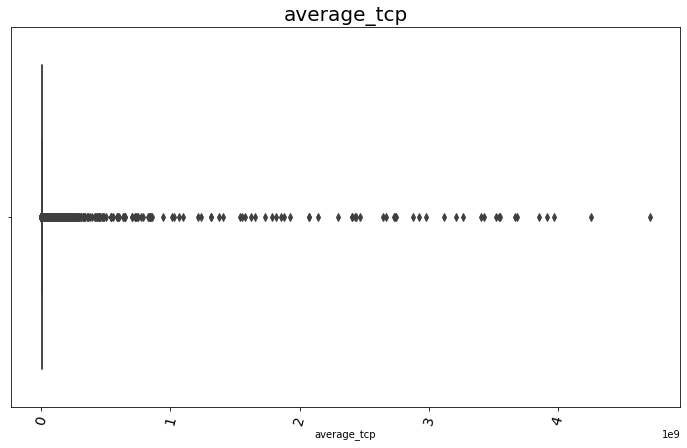

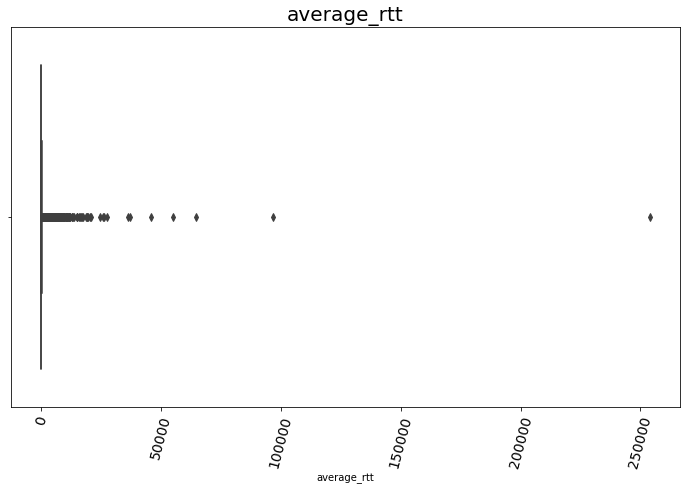

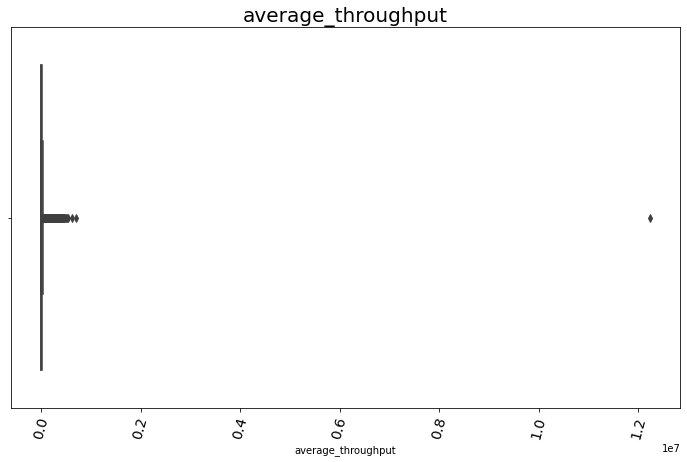

In [8]:
pu.plot_box(per_cust, "average_tcp", "average_tcp")
pu.plot_box(per_cust, "average_rtt", "average_rtt")
pu.plot_box(per_cust, "average_throughput", "average_throughput")

In [9]:
per_cust = du.remove_outlier(per_cust, 'average_rtt')

Old Shape:  (92720, 5)
New Shape:  (82785, 5)


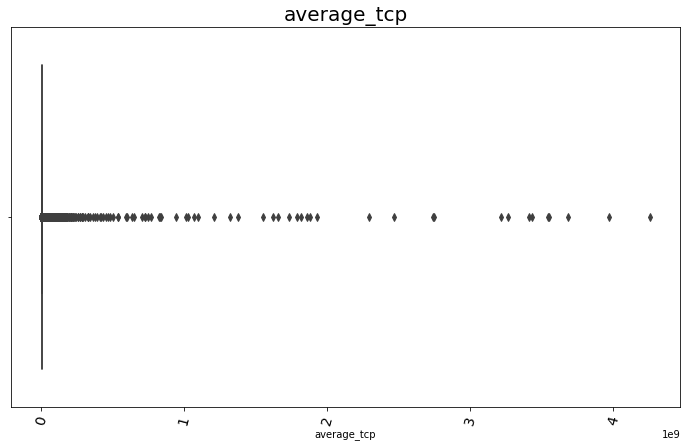

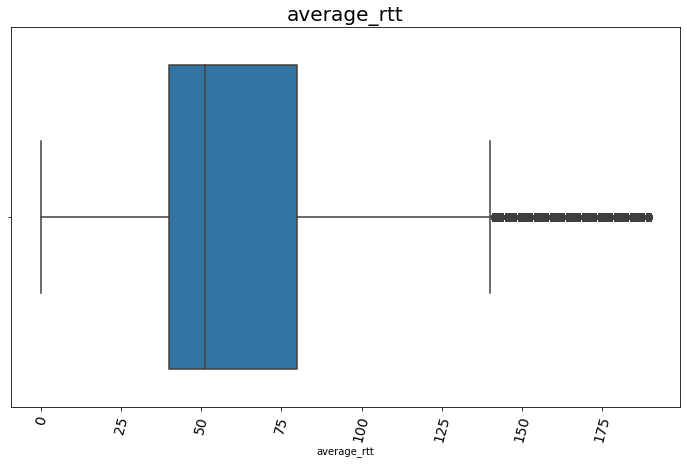

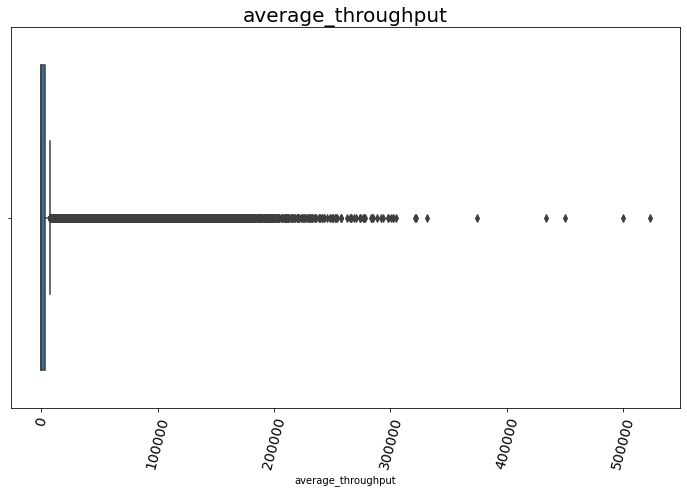

In [10]:
pu.plot_box(per_cust, "average_tcp", "average_tcp")
pu.plot_box(per_cust, "average_rtt", "average_rtt")
pu.plot_box(per_cust, "average_throughput", "average_throughput")

##  10 of the top, bottom and most frequent in TCP Values

In [11]:
tcp_top = per_cust.sort_values(by =['average_tcp'], ascending=False).head(10)
tcp_bottom = per_cust.sort_values(by =['average_tcp'], ascending=True).head(10)
counts = per_cust['average_tcp'].value_counts().head(10)
tcp_most  = pd.DataFrame(data=zip(counts.index.tolist(), counts.values.tolist()), columns=['value', 'count'])
tcp_most

,value,count
0,"3,811,982.50",49785
1,"7,623,965.00",7666
2,"11,435,947.50",957
3,"3,733,951.00",346
4,"15,247,930.00",88
5,"3,733,987.00",82
6,"80,655.50",75
7,"7,545,933.50",68
8,"3,733,975.00",50
9,"79,363.50",44


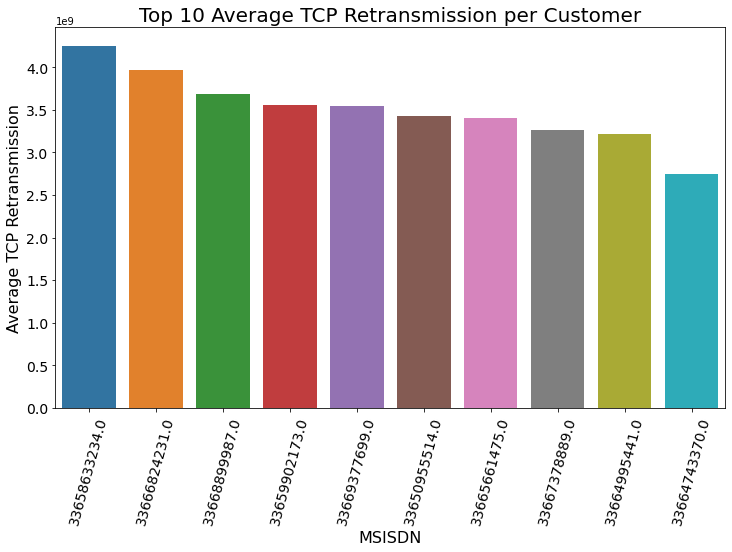

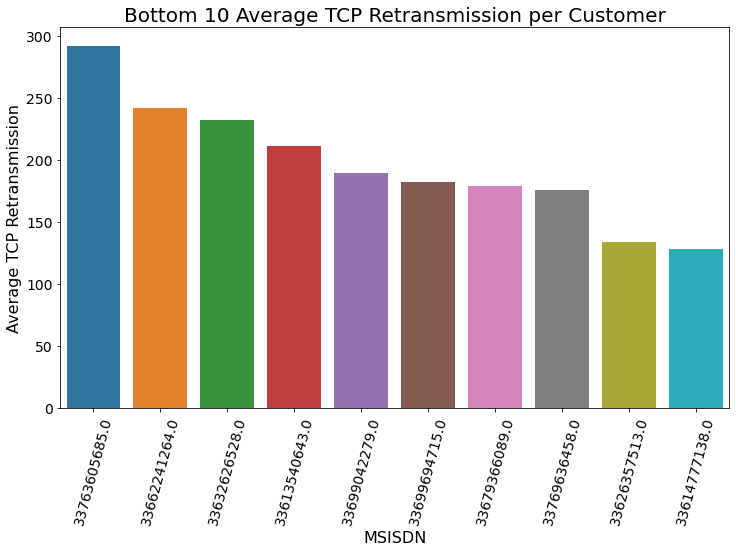

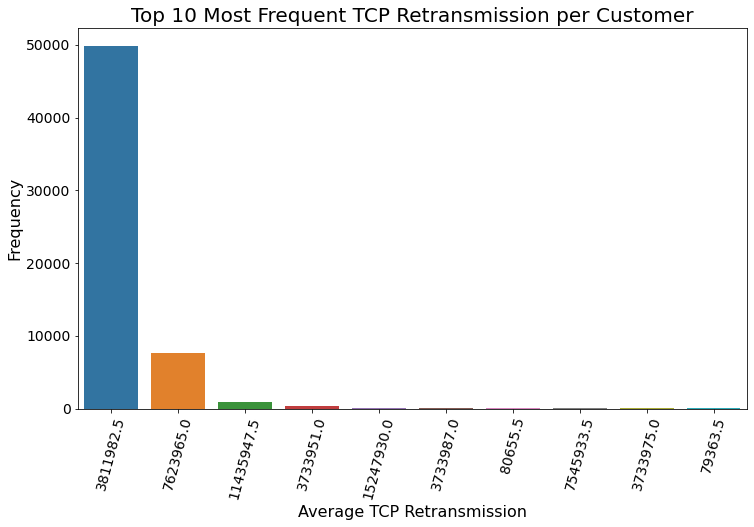

In [12]:
pu.plot_bar_sorted(tcp_top,  'MSISDN','average_tcp','Top 10 Average TCP Retransmission per Customer', 'MSISDN','Average TCP Retransmission' )
pu.plot_bar_sorted(tcp_bottom,  'MSISDN','average_tcp','Bottom 10 Average TCP Retransmission per Customer', 'MSISDN','Average TCP Retransmission' )
pu.plot_bar_sorted(tcp_most,  'value','count','Top 10 Most Frequent TCP Retransmission per Customer', 'Average TCP Retransmission','Frequency' )

##  10 of the top, bottom and most frequent in RTT Values

In [13]:
rtt_top = per_cust.sort_values(by =['average_rtt'], ascending=False).head(10)
rtt_bottom = per_cust.sort_values(by =['average_rtt'], ascending=True).head(10)
counts = per_cust['average_rtt'].value_counts().head(10)
rtt_most  = pd.DataFrame(data=zip(counts.index.tolist(), counts.values.tolist()), columns=['value', 'count'])
rtt_most

,value,count
0,51.00,18411
1,29.00,2932
2,102.00,2418
3,39.00,2241
4,30.00,1470
5,38.00,1424
6,28.00,1410
7,40.00,1338
8,49.00,1088
9,31.00,1040


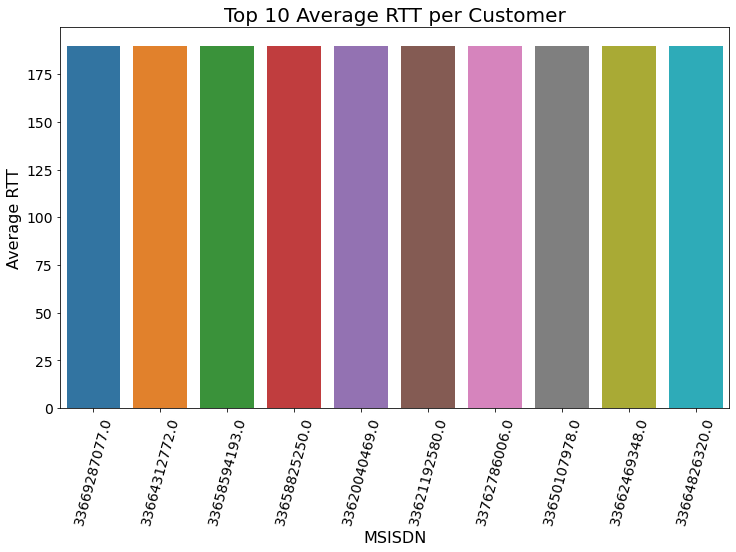

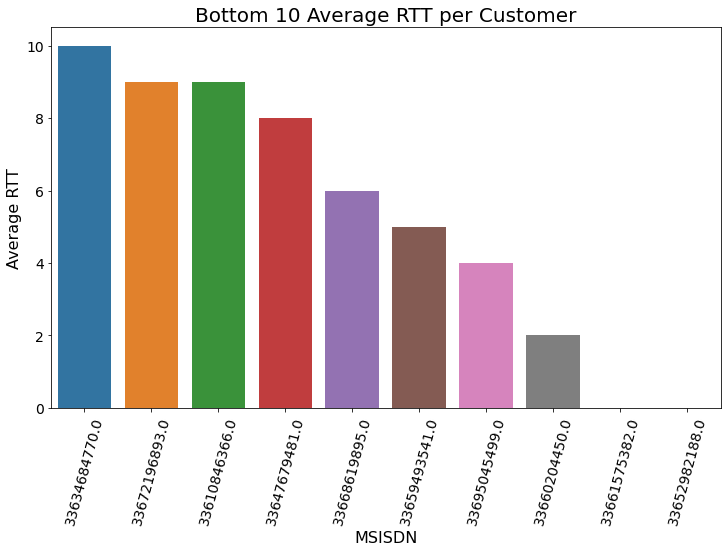

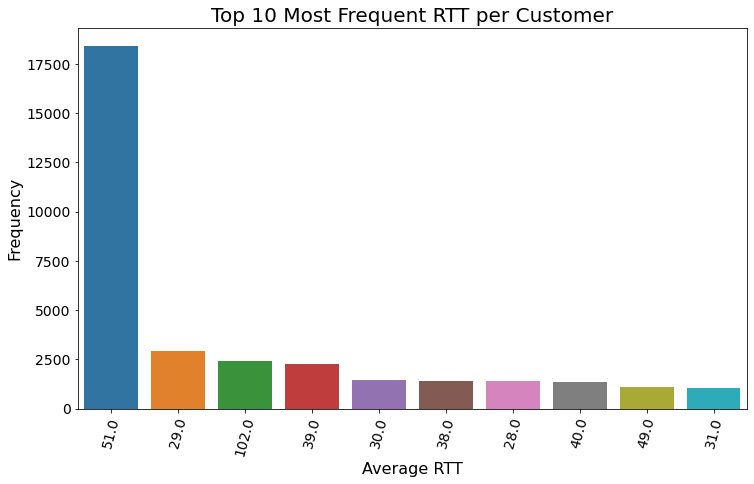

In [14]:
pu.plot_bar_sorted(rtt_top,  'MSISDN','average_rtt','Top 10 Average RTT per Customer', 'MSISDN','Average RTT' )
pu.plot_bar_sorted(rtt_bottom,  'MSISDN','average_rtt','Bottom 10 Average RTT per Customer', 'MSISDN','Average RTT' )
pu.plot_bar_sorted(rtt_most,  'value','count','Top 10 Most Frequent RTT per Customer', 'Average RTT','Frequency' )

##  10 of the top, bottom and most frequent in Throughput Values

In [15]:
throughput_top = per_cust.sort_values(by =['average_throughput'], ascending=False).head(10)
throughput_bottom = per_cust.sort_values(by =['average_throughput'], ascending=True).head(10)
counts = per_cust['average_throughput'].value_counts().head(10)
throughput_most  = pd.DataFrame(data=zip(counts.index.tolist(), counts.values.tolist()), columns=['value', 'count'])
throughput_bottom

,MSISDN,handset_type,average_tcp,average_rtt,average_throughput
55149,"33,666,630,032.00",Apple iPhone 8 (A1905),"3,811,982.50",51.00,0.00
36428,"33,660,759,976.00",Lenovo Moto E Plus (4Th Gen) Go12071045,"3,811,982.50",51.00,0.00
82173,"33,761,309,821.00",Lg Lg-T385,"3,811,982.50",70.00,0.00
36339,"33,660,736,208.00",Huawei B528S-23A,"3,811,982.50",51.00,0.00
36269,"33,660,719,258.00",Apple iPhone 6 (A1586),"3,811,982.50",51.00,0.00
73925,"33,698,388,382.00",Samsung Galaxy S6 Edge (Sm-G925X),"3,811,982.50",51.00,0.00
2602,"33,609,245,815.00",Apple iPhone Xs Max (A2101),"3,811,982.50",51.00,0.00
51852,"33,665,318,260.00",Samsung Galaxy S8 (Sm-G950F),"3,811,982.50",51.00,0.00
21790,"33,650,346,934.00",Apple iPhone 6S (A1688),"3,811,982.50",51.00,0.00
9766,"33,622,104,963.00",Samsung Galaxy S7 Edge (Sm-G935X),"3,811,982.50",51.00,0.00


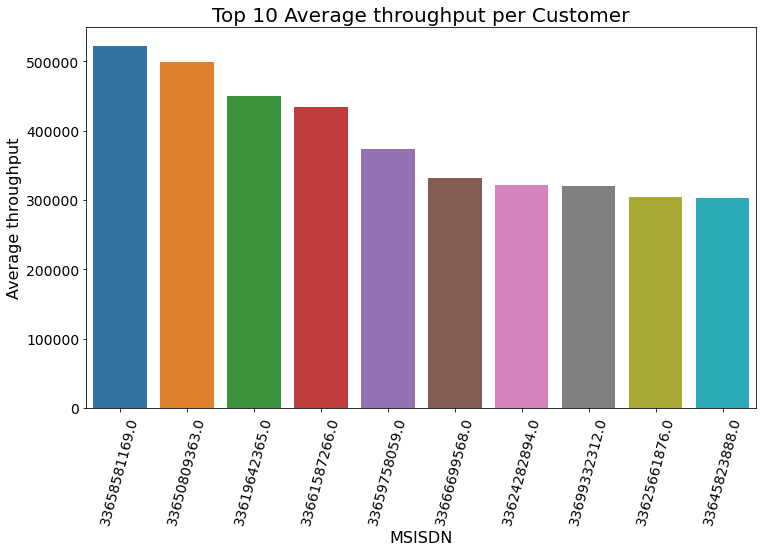

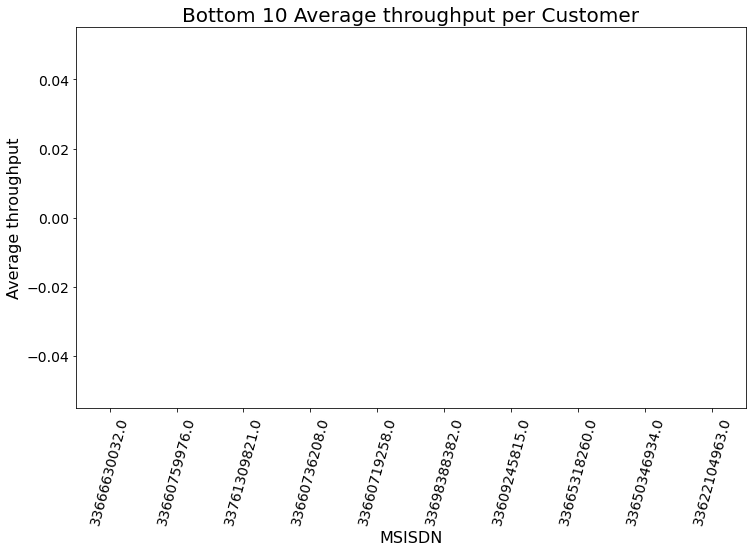

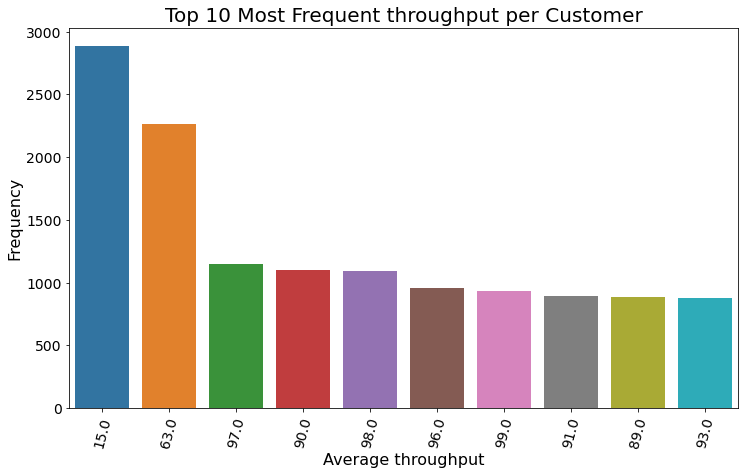

In [16]:
pu.plot_bar_sorted(throughput_top,  'MSISDN','average_throughput','Top 10 Average throughput per Customer', 'MSISDN','Average throughput' )
pu.plot_bar_sorted(throughput_bottom,  'MSISDN','average_throughput','Bottom 10 Average throughput per Customer', 'MSISDN','Average throughput' )
pu.plot_bar_sorted(throughput_most,  'value','count','Top 10 Most Frequent throughput per Customer', 'Average throughput','Frequency' )

In [17]:
per_hand = pd.DataFrame()

In [18]:
per_hand['handset_set'] = per_cust.groupby('handset_type').groups.keys()

per_hand['average_tcp'] = pd.DataFrame(per_cust.groupby('handset_type')['average_tcp']
     .agg(ave_tcp = 'sum' )).reset_index()['ave_tcp']

per_hand['average_throughput'] = pd.DataFrame(per_cust.groupby('handset_type')['average_throughput']
     .agg(ave_throughput = 'sum' )).reset_index()['ave_throughput']

per_hand.head()

,handset_set,average_tcp,average_throughput
0,A-Link Telecom I. Cubot X18 Plus,"2,771,476.50","25,118.00"
1,Acer Liquid M220,"3,811,982.50",34.00
2,Acer Liquid Zest 4G,"11,142.00","29,089.00"
3,Acer Liquid Zest Plus,"3,811,982.50",53.00
4,Alif Communicati. Pulian Cm84,"3,811,982.50",22.00


In [19]:
# pu.plot_box(per_hand, "average_tcp", "average_tcp")
per_hand = du.remove_outlier(per_hand, 'average_tcp')

Old Shape:  (948, 3)
New Shape:  (779, 3)


### The distribution of the average throughput  per handset type

<AxesSubplot:xlabel='handset_set'>

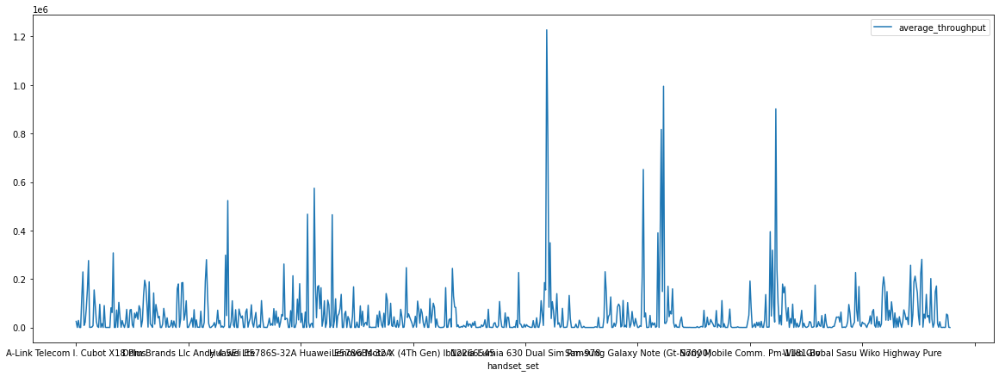

In [20]:
per_hand.plot(x='handset_set', y=['average_throughput'], kind='line', figsize=(20, 7))

### The average TCP retransmission view per handset type

<AxesSubplot:xlabel='handset_set'>

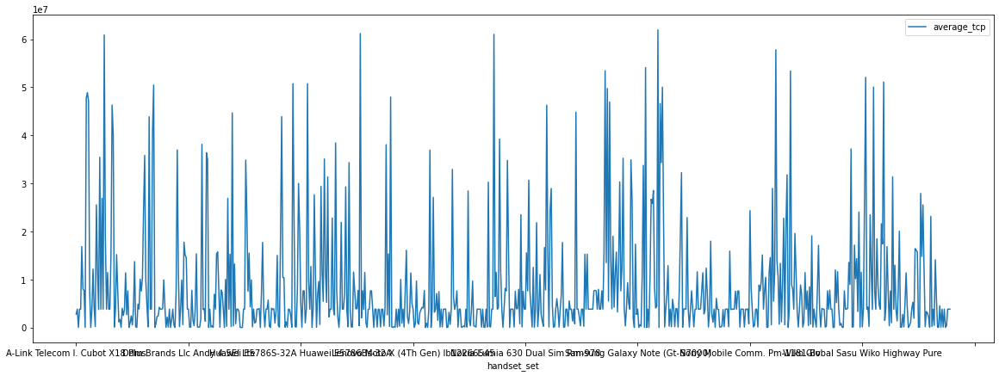

In [21]:
per_hand.plot(x='handset_set', y=['average_tcp'], kind='line', figsize=(20, 7))

### Segment users into groups of experiences

In [22]:
# scale / Normalize each metric
x = per_cust.iloc[:,[2,3, 4]].values

scaled_data = pd.DataFrame()

lb = LabelEncoder()
# scaled_data['handset_type'] = lb.fit_transform(per_cust['handset_type'])

scaler = StandardScaler()
scaled_features = scaler.fit_transform(x)
scaled_data['average_tcp'] = scaled_features[:][:,0]
scaled_data['average_rtt'] = scaled_features[:][:,1]
scaled_data['average_throughput'] = scaled_features[:][:,2]
scaled_data.head()

,average_tcp,average_rtt,average_throughput
0,-0.04,-0.51,-0.43
1,-0.04,-0.92,-0.43
2,-0.04,-0.37,-0.43
3,-0.11,0.55,-0.43
4,-0.04,-1.01,-0.43


In [23]:
kmeans = KMeans(
       init = "k-means++",
       n_clusters=3,
       n_init=10,
       max_iter=300,
       random_state=0 )

In [24]:
label = kmeans.fit(scaled_data)

In [25]:
scaled_data['label'] = kmeans.labels_
scaled_data.head(10)

,average_tcp,average_rtt,average_throughput,label
0,-0.04,-0.51,-0.43,0
1,-0.04,-0.92,-0.43,0
2,-0.04,-0.37,-0.43,0
3,-0.11,0.55,-0.43,0
4,-0.04,-1.01,-0.43,0
5,-0.04,-0.37,-0.43,0
6,-0.04,-0.31,1.15,0
7,0.04,1.05,-0.43,0
8,-0.04,-0.06,-0.43,0
9,-0.04,-0.98,-0.43,0


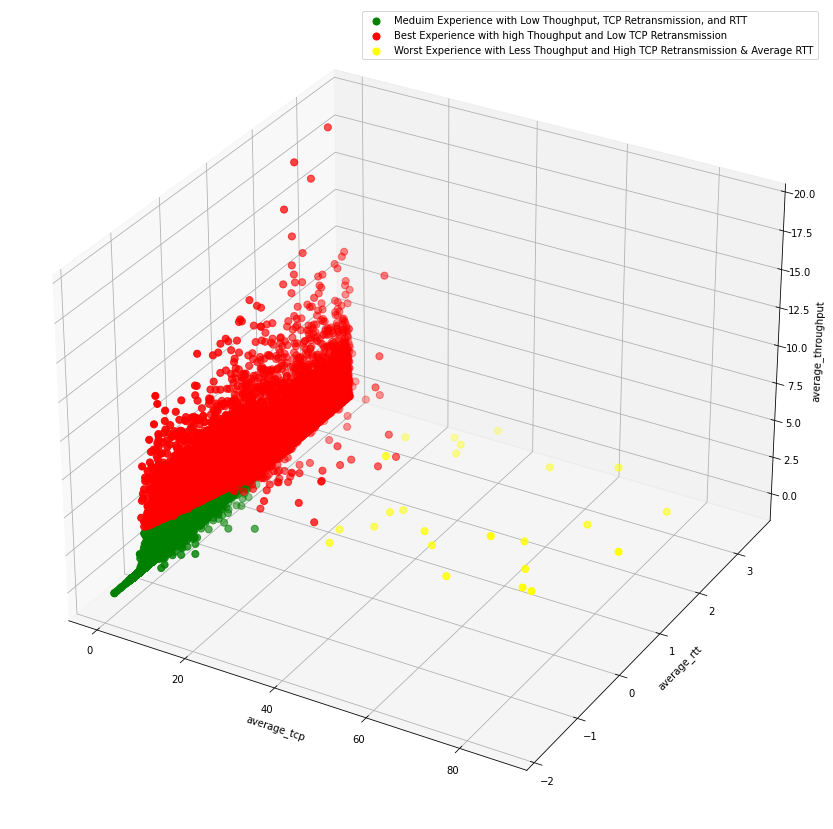

In [26]:
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(
           scaled_data[scaled_data['label'] == 0]["average_tcp"],
           scaled_data[scaled_data['label'] == 0]["average_rtt"],
           scaled_data[scaled_data['label'] == 0]["average_throughput"]
           ,s = 50, c = 'green', label = "Meduim Experience with Low Thoughput, TCP Retransmission, and RTT")

ax.scatter(
           scaled_data[scaled_data['label'] == 1]["average_tcp"],
           scaled_data[scaled_data['label'] == 1]["average_rtt"],
           scaled_data[scaled_data['label'] == 1]["average_throughput"]
           ,s = 50, c = 'red', label = "Best Experience with high Thoughput and Low TCP Retransmission")

ax.scatter(
           scaled_data[scaled_data['label'] == 2]["average_tcp"],
           scaled_data[scaled_data['label'] == 2]["average_rtt"],
           scaled_data[scaled_data['label'] == 2]["average_throughput"]
           ,s = 50, c = 'yellow', label = "Worst Experience with Less Thoughput and High TCP Retransmission & Average RTT")

# ax.scatter(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1], s = 100, c = "yellow", label = "centroids")
ax.set_xlabel("average_tcp")
ax.set_ylabel("average_rtt")
ax.set_zlabel("average_throughput")
ax.legend()
plt.show()

In [132]:
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py

In [134]:
# 3d scatterplot using plotly
Scene = dict(xaxis = dict(title  = 'average_tcp -->'),yaxis = dict(title  = 'average_rtt--->'),zaxis = dict(title  = 'average_throughput-->'))

# model.labels_ is nothing but the predicted clusters i.e y_clusters
labels = kmeans.labels_
trace = go.Scatter3d(
                   x = scaled_data["average_tcp"],
                   y = scaled_data["average_rtt"],
                   z = scaled_data["average_throughput"], mode='markers',marker=dict(color = labels, size= 10, line=dict(color= 'black',width = 10)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene,height = 800,width = 800)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()